In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
from warnings import filterwarnings
filterwarnings('ignore')




# ***Libraries Used:***

    Pandas: For data manipulation and analysis.
    NumPy: For numerical operations.
    Matplotlib & Seaborn: For static and advanced data visualizations.
    Plotly: For interactive plots.
    Scikit-learn: For machine learning models and metrics.



In [2]:
file_path = '/kaggle/input/teaspad/TestPad_PCB_XYRGB_V2.csv'  
data = pd.read_csv(file_path)



# ***Data Loading:***

    The notebook loads a CSV file containing RGB values and their corresponding coordinates.



# ***Data Exploration:***

    Displays the first few rows of the dataset to understand its structure.
    Provides a summary of the data, including the number of entries and data types.
    Checks for missing values to ensure data integrity

In [3]:
data.head()

,X,Y,R,G,B,Grey
0,105,0,0.909804,0.976471,0.937255,0
1,106,0,0.792157,0.901961,0.843137,0
2,107,0,0.631373,0.788235,0.694118,0
3,108,0,0.474510,0.670588,0.556863,0
4,109,0,0.341176,0.584314,0.439216,0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 723552 entries, 0 to 723551
Data columns (total 6 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   X       723552 non-null  int64  
 1   Y       723552 non-null  int64  
 2   R       723552 non-null  float64
 3   G       723552 non-null  float64
 4   B       723552 non-null  float64
 5   Grey    723552 non-null  int64  
dtypes: float64(3), int64(3)
memory usage: 33.1 MB


In [5]:
data.isnull()

,X,Y,R,G,B,Grey
0,False,False,False,False,False,False
1,False,False,False,False,False,False
2,False,False,False,False,False,False
3,False,False,False,False,False,False
4,False,False,False,False,False,False
...,...,...,...,...,...,...
723547,False,False,False,False,False,False
723548,False,False,False,False,False,False
723549,False,False,False,False,False,False
723550,False,False,False,False,False,False


In [6]:
data.isna()

,X,Y,R,G,B,Grey
0,False,False,False,False,False,False
1,False,False,False,False,False,False
2,False,False,False,False,False,False
3,False,False,False,False,False,False
4,False,False,False,False,False,False
...,...,...,...,...,...,...
723547,False,False,False,False,False,False
723548,False,False,False,False,False,False
723549,False,False,False,False,False,False
723550,False,False,False,False,False,False




# ***Data Visualization:***

    Creates a scatter plot to visualize the relationship between X and Y coordinates, colored by RGB values, allowing for an intuitive understanding of data distribution.



Text(0, 0.5, 'Y Coordinate')

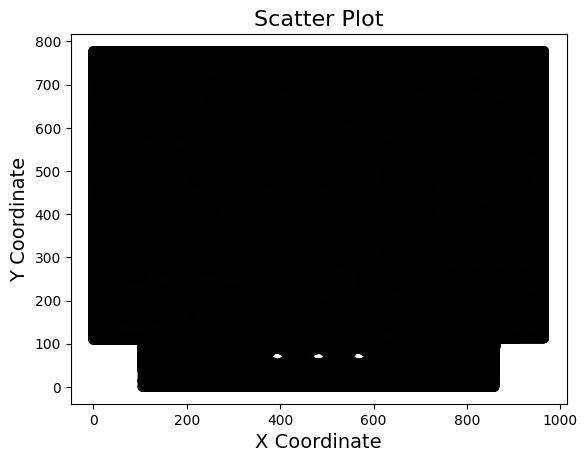

In [7]:
plt.scatter(data['X'], data['Y'], c=data[['R', 'G', 'B']].values/255)
plt.title('Scatter Plot', fontsize=16)
plt.xlabel('X Coordinate', fontsize=14)
plt.ylabel('Y Coordinate', fontsize=14)

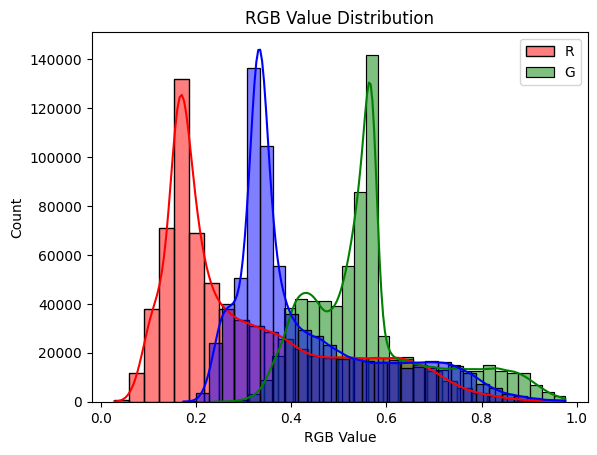

In [8]:

sns.histplot(data['R'], color='red', kde=True, bins=30, label='R')
sns.histplot(data['G'], color='green', kde=True, bins=30, label='G')
sns.histplot(data['B'], color='blue', kde=True, bins=30)
plt.title('RGB Value Distribution')
plt.xlabel('RGB Value')
plt.legend()

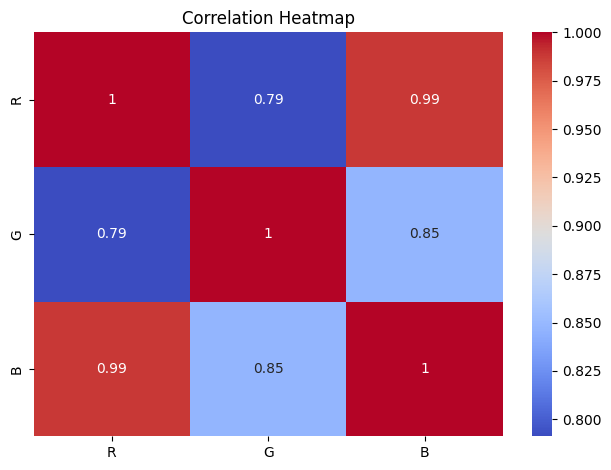

In [9]:
sns.heatmap(data[['R', 'G', 'B']].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')

plt.tight_layout()
plt.show()

Text(0, 0.5, 'R Value')

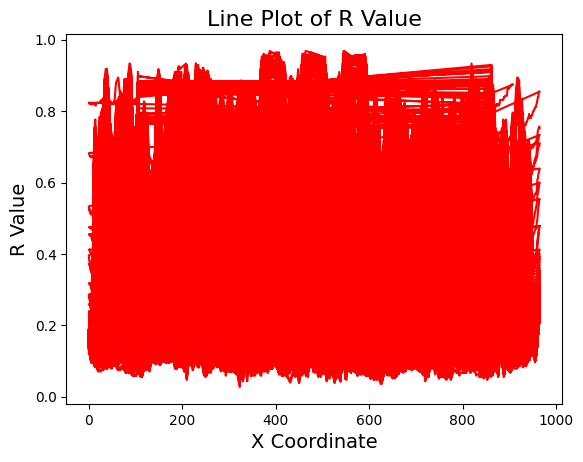

In [10]:

plt.plot(data['X'], data['R'], color='red')
plt.title('Line Plot of R Value', fontsize=16)
plt.xlabel('X Coordinate', fontsize=14)
plt.ylabel('R Value', fontsize=14)

Text(0, 0.5, 'G Value')

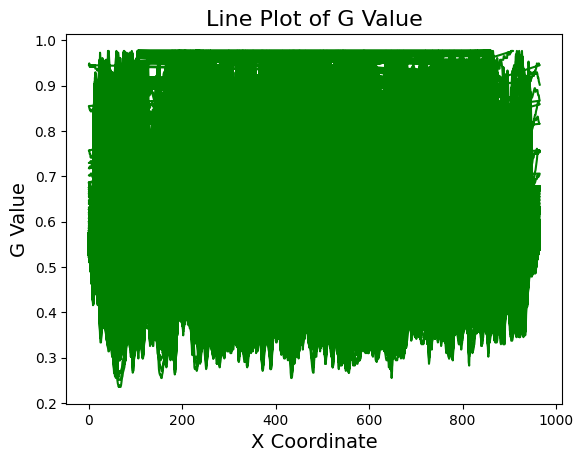

In [11]:
plt.plot(data['X'], data['G'], color='green')
plt.title('Line Plot of G Value', fontsize=16)
plt.xlabel('X Coordinate', fontsize=14)
plt.ylabel('G Value', fontsize=14)

Text(0, 0.5, 'B Value')

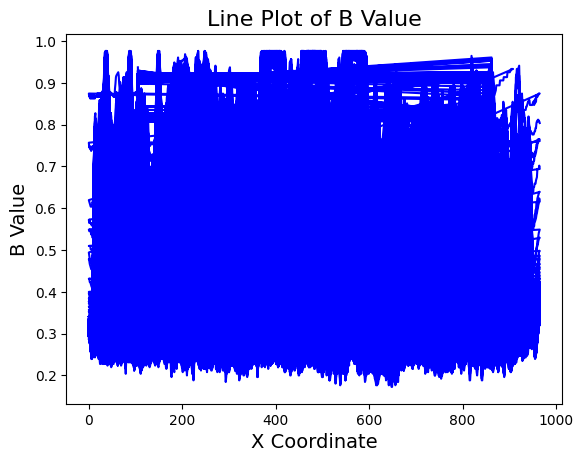

In [12]:
plt.plot(data['X'], data['B'], color='blue')
plt.title('Line Plot of B Value', fontsize=16)
plt.xlabel('X Coordinate', fontsize=14)
plt.ylabel('B Value', fontsize=14)

Text(0, 0.5, 'Frequency')

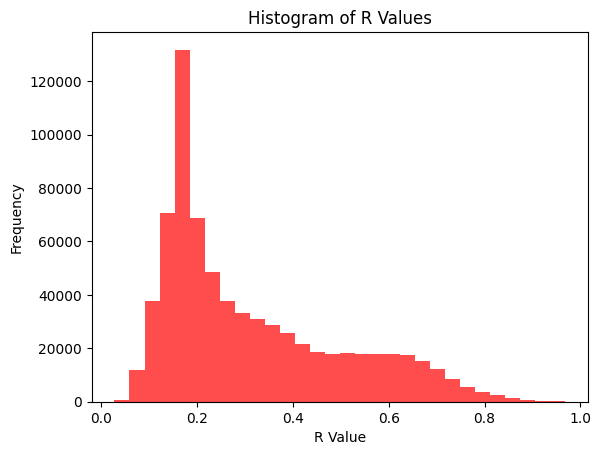

In [13]:
plt.hist(data['R'], bins=30, color='red', alpha=0.7)
plt.title('Histogram of R Values')
plt.xlabel('R Value')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

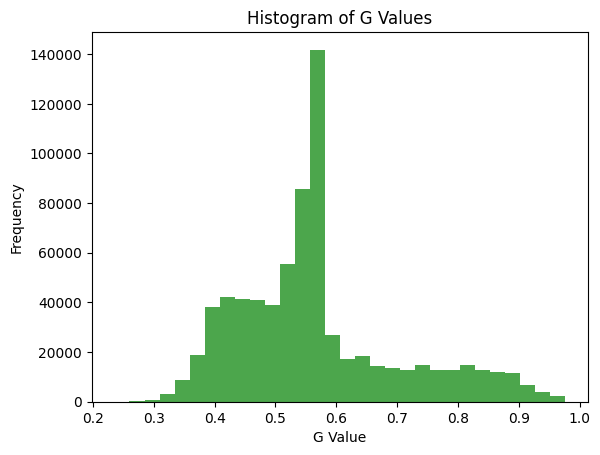

In [14]:
plt.hist(data['G'], bins=30, color='green', alpha=0.7)
plt.title('Histogram of G Values')
plt.xlabel('G Value')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

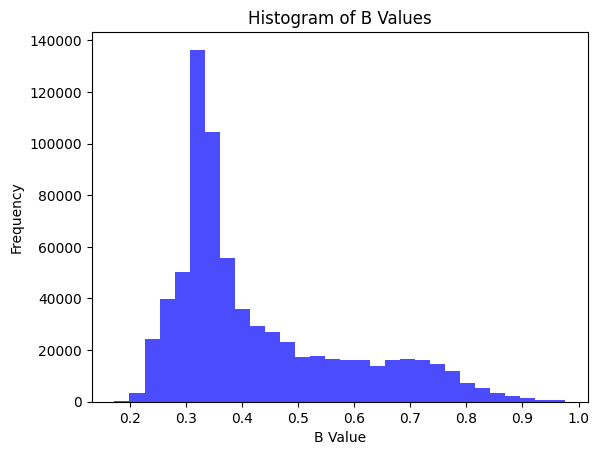

In [15]:

plt.hist(data['B'], bins=30, color='blue', alpha=0.7)
plt.title('Histogram of B Values')
plt.xlabel('B Value')
plt.ylabel('Frequency')

Text(0, 0.5, 'Value')

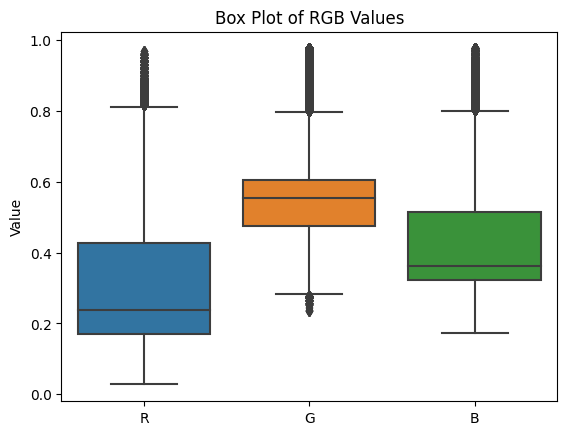

In [16]:
sns.boxplot(data=data[['R', 'G', 'B']])
plt.title('Box Plot of RGB Values')
plt.ylabel('Value')

Text(0, 0.5, 'Value')

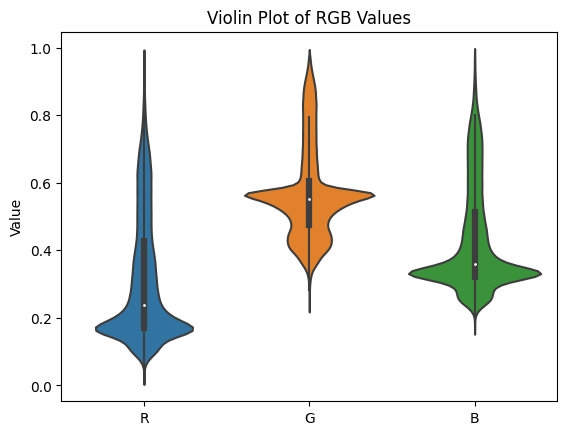

In [17]:
sns.violinplot(data=data[['R', 'G', 'B']])
plt.title('Violin Plot of RGB Values')
plt.ylabel('Value')

Text(0.5, 1.0, 'Pair Plot of RGB Values')

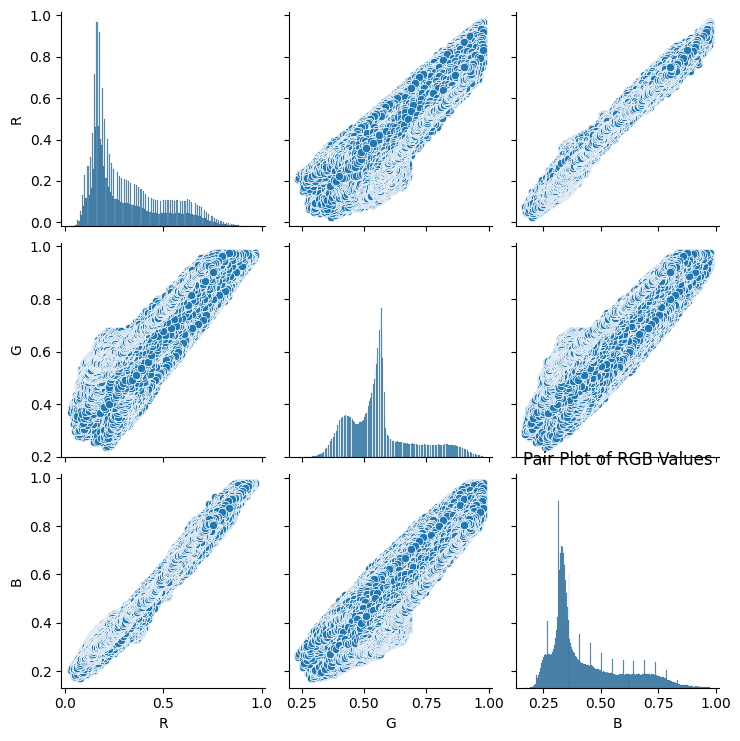

In [18]:
sns.pairplot(data[['R', 'G', 'B']])
plt.title('Pair Plot of RGB Values')

Text(0.5, 1.0, 'Correlation Heatmap')

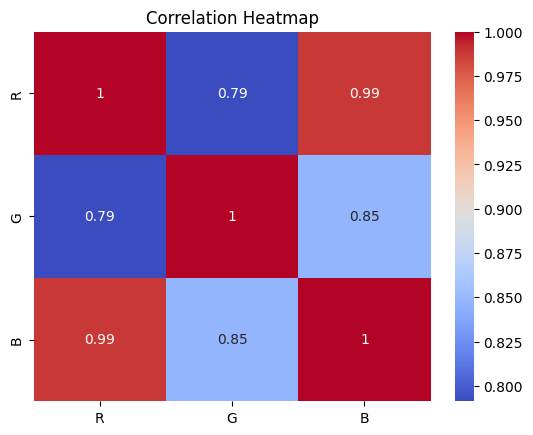

In [19]:
sns.heatmap(data[['R', 'G', 'B']].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')

Text(0.5, 0, 'R')

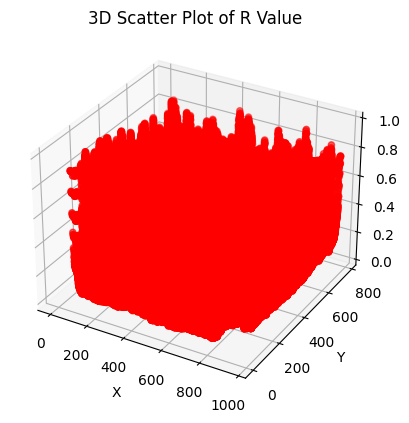

In [20]:
ax = plt.subplot(projection='3d')
ax.scatter(data['X'], data['Y'], data['R'], c='red')
ax.set_title('3D Scatter Plot of R Value')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('R')

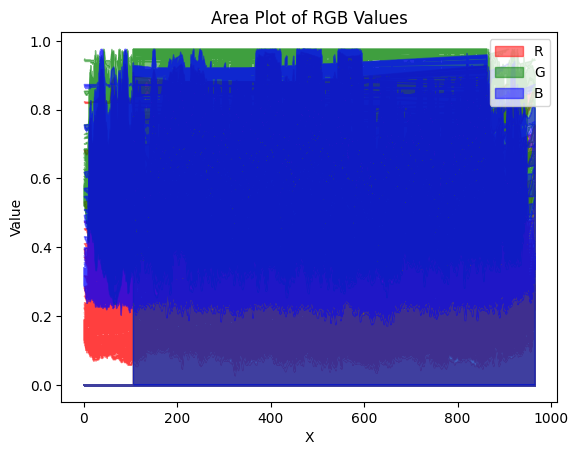

In [21]:
plt.fill_between(data['X'], data['R'], color='red', alpha=0.5, label='R')
plt.fill_between(data['X'], data['G'], color='green', alpha=0.5, label='G')
plt.fill_between(data['X'], data['B'], color='blue', alpha=0.5, label='B')
plt.title('Area Plot of RGB Values')
plt.xlabel('X')
plt.ylabel('Value')
plt.legend()

Text(0, 0.5, 'Mean Value')

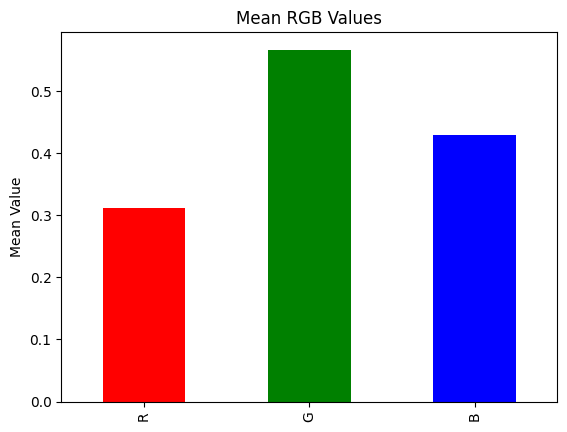

In [22]:
mean_rgb = data[['R', 'G', 'B']].mean()
mean_rgb.plot(kind='bar', color=['red', 'green', 'blue'])
plt.title('Mean RGB Values')
plt.ylabel('Mean Value')

Text(0.5, 1.0, 'Polar Plot of R Values')

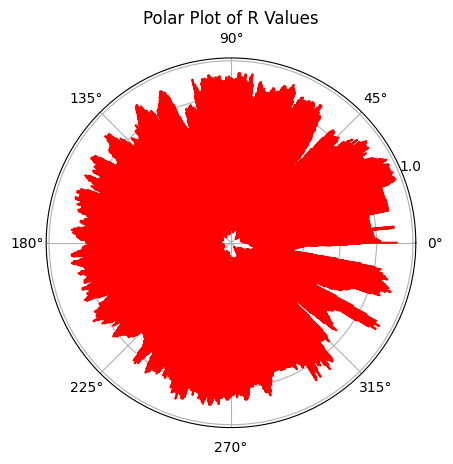

In [23]:
r = data['R'].values
theta = np.linspace(0, 2 * np.pi, len(r))
plt.subplot(polar=True)
plt.plot(theta, r, color='red')
plt.title('Polar Plot of R Values')

In [25]:
fig3 = px.box(data, y='R', title='Plotly Box Plot of R Values')
fig3.show()

In [26]:
fig4 = px.violin(data, y='R', title='Plotly Violin Plot of R Values')
fig4.show()

In [27]:
# Prepare data for modeling
X = data[['X', 'Y']]
y = data[['R', 'G', 'B']]


In [28]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



# ***Modeling:***

    The inclusion of machine learning libraries suggests potential modeling tasks, although specific modeling steps are not detailed in the provided content.



In [29]:
from sklearn.multioutput import MultiOutputRegressor

In [30]:
models = {
        'Linear Regression':MultiOutputRegressor(LinearRegression()),
        'Decision Tree': MultiOutputRegressor(DecisionTreeRegressor()),
        'Random Forest': MultiOutputRegressor(RandomForestRegressor()),
         'Gradient Boosting': MultiOutputRegressor(GradientBoostingRegressor()),
        'AdaBoost': MultiOutputRegressor(AdaBoostRegressor())
    }


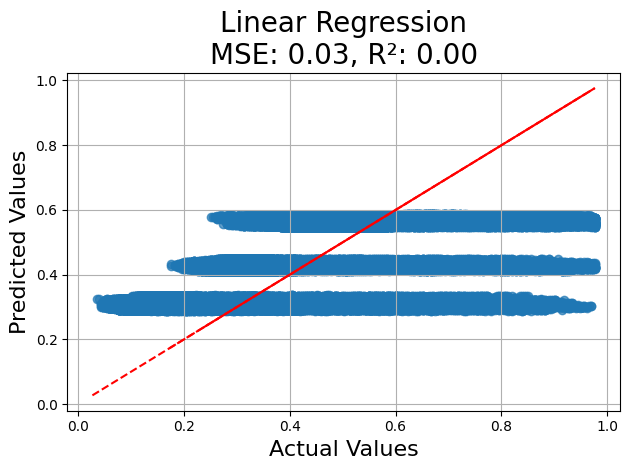

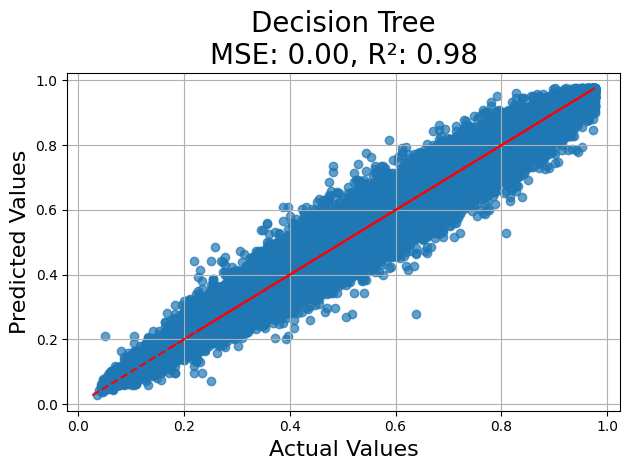

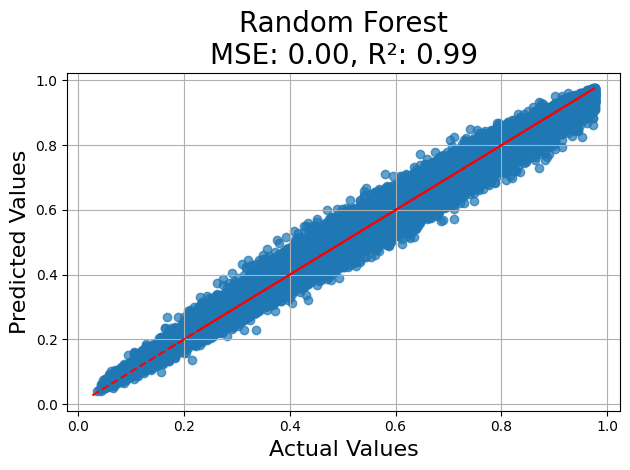

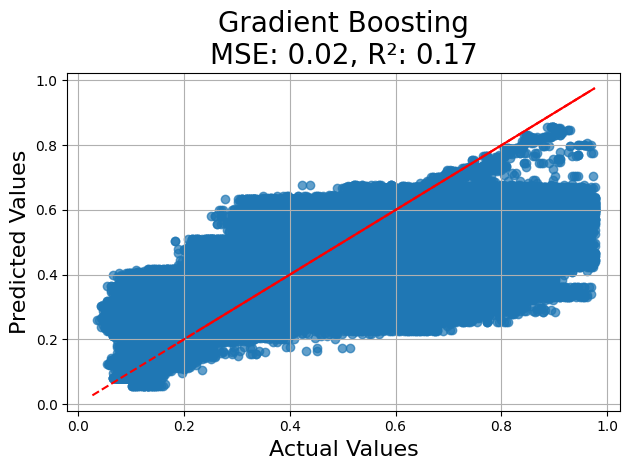

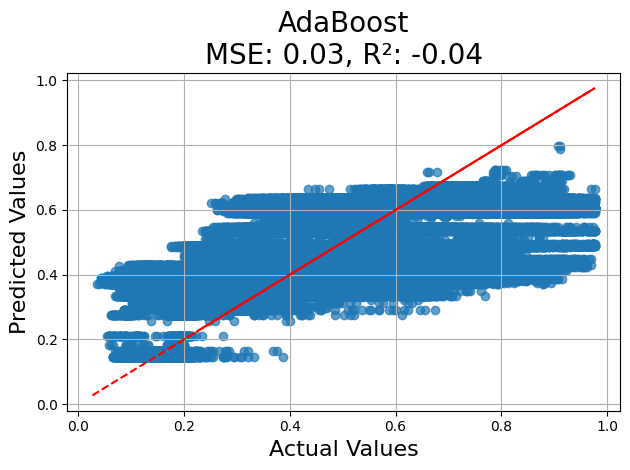

In [31]:
 for i, (name, model) in enumerate(models.items()):
        
        model.fit(X_train, y_train)
        
        y_pred = model.predict(X_test)

       
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

      
        
        plt.scatter(y_test, y_pred, alpha=0.7)
        plt.plot([y.min(), y.max()], [y.min(), y.max()], '--', color='red') 
        plt.title(f'{name}\nMSE: {mse:.2f}, R²: {r2:.2f}', fontsize=20)  
        plt.xlabel('Actual Values', fontsize=16) 
        plt.ylabel('Predicted Values', fontsize=16)   
        plt.grid(True)  

        plt.tight_layout()
        plt.show()

# ***Conclusion***

***This notebook serves as a foundational tool for data analysis and visualization, providing insights into the dataset through exploratory data analysis and visual representation. It is suitable for users looking to understand the data relationships and potentially build predictive models using the RGB and coordinate data.***